In [ ]:
# pip install distfit

In [2]:
import numpy as np
import pandas as pd
import scipy.stats as ss
import random
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import yfinance as yf
import plotly.graph_objects as go
from scipy.stats import linregress, norm, t, skewnorm, skew, kurtosis, probplot, kstest
from scipy.linalg import eigh
import curl_cffi
from curl_cffi import requests
# from distfit import distfit
from functools import cached_property

In [ ]:
# delta - skew parameter
# a - probability up/down at 0
# p - probability up/down at /= 0
# S0 - starting point of the process
# granularity - amount of steps in one time period
# N - number of simulated paths
seed1 = 10
seed2 = 20

http://azzalini.stat.unipd.it/SN/

https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.skewnorm.html

<h2>FUNCTIONS<h2>

In [39]:
# info = [start, end, interval]
# stocklist = [aapl, msft, nvda]
# seeds = np.linspace(0, 10*len(stock_list), len(stocklist)*2)
class data_lord:
  def __init__(self, stocklist, info):
    self.stocklist_ = stocklist
    self.start_ = info[0]
    self.end_ = info[1]
    self.interval_ = info[2]
    self.session_ = requests.Session(impersonate="chrome")
    self.rf_ = 0.05 # to vary
    self.num_ = 100000   # to vary

  @cached_property
  def get_data(self, stock_ticker=None):
    stock_data = []
    if stock_ticker is None:
      for stock_ in self.stocklist_:
        ticker = yf.Ticker(stock_, session = self.session_)
        data = ticker.history(start = self.start_, end = self.end_, interval = self.interval_)
        stock_data.append(data)
    else:
      ticker = yf.Ticker(stock_ticker, session = self.session_)
      data = ticker.history(start = self.start_, end = self.end_, interval = self.interval_)
      stock_data.append(data)

    return stock_data

  @cached_property
  def get_close(self):
    data_list = self.get_data
    close_list = [np.array(data['Close'].reset_index(drop=True)) for data in data_list]

    return close_list

  def get_returns(self, type_ = 'simple'):
    close_list = self.get_close
    if type_ == 'simple':
      returns = [close[1:]/close[:-1] - 1 for close in close_list]
    elif type_ == 'log':
      returns = [np.log(close[1:]/close[:-1]) for close in close_list]

    return returns

  def get_returns_train(self):
    tt_assets = self.ts_train_test_split(0.25)
    returns = [np.log(t_asset[0][1:]/t_asset[0][:-1]) for t_asset in tt_assets]

    return returns

  @cached_property
  def get_corr(self):
    returns_list = self.get_returns_train()
    corr_mat = np.corrcoef(returns_list)

    return corr_mat

  @cached_property
  def get_cov(self):
    returns_list = self.get_returns_train()
    cov_mat = np.cov(returns_list)

    return cov_mat

  @cached_property
  def get_std_returns(self):
    stds = []
    cov_mat = self.get_cov
    lenx = cov_mat.shape[0]
    stds = [np.sqrt(cov_mat[i,i]) for i in range(0, lenx)]

    return stds

  @cached_property
  def get_mean_returns(self):
    returns_list = self.get_returns_train()
    means = [np.mean(returns) for returns in returns_list]

    return means

  def portfolio_specs(self, weights):
    N = 250
    weights = np.array(weights)
    means = np.array(self.get_mean_returns)
    yearly_return = np.sum(means * weights) * N
    yearly_std = np.sqrt(np.dot(weights.T, np.dot(self.get_cov, weights))) * np.sqrt(N)

    return yearly_std, yearly_return

  @cached_property
  def random_portfolios(self):
    results = np.zeros((3, self.num_))
    weights_output = []

    for i in range(0, self.num_):
        weights = np.random.random(len(self.stocklist_))
        weights /= np.sum(weights)
        weights_output.append(weights)
        portfolio_std_dev, portfolio_return = self.portfolio_specs(weights)
        results[0,i] = portfolio_std_dev
        results[1,i] = portfolio_return
        results[2,i] = (portfolio_return - self.rf_) / portfolio_std_dev

    return results, weights_output

  @cached_property
  def max_shr_portfolio(self):
    results, weights = self.random_portfolios
    max_sharpe_idx = np.argmax(results[2])
    sdp, rp = results[0, max_sharpe_idx], results[1, max_sharpe_idx]
    max_shr_weights = weights[max_sharpe_idx]

    return max_shr_weights, sdp, rp

  @cached_property
  def fit_skewnorm(self):
    returns_list = self.get_returns_train()
    params_skn_list = [skewnorm.fit(returns) for returns in returns_list]

    return params_skn_list

  @cached_property
  def get_betas(self):
    params_skn_list = self.fit_skewnorm
    betas_skn_list = [params[0] for params in params_skn_list]

    return betas_skn_list

  @cached_property
  def get_deltas(self):
    betas_skn_list = self.get_betas
    deltas_skn_list = [betas / np.sqrt( 1 + betas ** 2 ) for betas in betas_skn_list]

    return deltas_skn_list

  # cached_property
  # def get_skewcorr(self):
  #   corr_mat = self.get_corr
  #   deltas = self.get_deltas
  #   lenx = np.shape(corr_mat)[0]
  #   skcorr_mat = np.empty_like(corr_mat)
  #   for i in range(0, lenx):
  #     for j in range(0, lenx):
  #       skcorr_mat[i,j] = ( corr_mat[i,j] - ( 2 / np.pi ) * deltas[i] * deltas[j] ) / ( np.sqrt(1 - 2 / np.pi * deltas[i] ** 2) * np.sqrt(1 - 2 / np.pi * deltas[j] ** 2) )

  #   return skcorr_mat

  #
  # def get_skewcorr(self, epsilon=1e-6):
  #   """
  #   Computes the skew-normal corrected correlation matrix.
  #   If the resulting matrix is not positive definite,
  #   applies minimal spectral adjustment to enforce it.

  #   """
  #   corr_mat = self.get_corr
  #   deltas = self.get_deltas
  #   lenx = np.shape(corr_mat)[0]

    # # Step 1: Compute skew-normal adjusted correlation matrix
    # skcorr_mat = np.empty_like(corr_mat)
    # for i in range(lenx):
    #     for j in range(lenx):
    #         numerator = corr_mat[i, j] - (2 / np.pi) * deltas[i] * deltas[j]
    #         denominator = np.sqrt(1 - (2 / np.pi) * deltas[i]**2) * np.sqrt(1 - (2 / np.pi) * deltas[j]**2)
    #         skcorr_mat[i, j] = numerator / denominator

    # # Ensure symmetry (for numerical safety)
    # skcorr_mat = (skcorr_mat + skcorr_mat.T) / 2

    # # Check positive definiteness
    # eigvals = np.linalg.eigvalsh(skcorr_mat)
    # if np.all(eigvals > 0):
    #     return skcorr_mat  # Already positive definite

    # # Minimal eigenvalue adjustment (if needed, so original matrix is not PSD)
    # eigvals, eigvecs = eigh(skcorr_mat)
    # eigvals_adj = np.clip(eigvals, epsilon, None)
    # skcorr_mat = eigvecs @ np.diag(eigvals_adj) @ eigvecs.T

    # # Symmetrize final result again
    # skcorr_mat = (skcorr_mat + skcorr_mat.T) / 2

    # return skcorr_mat
    # return corr_mat

  def ts_train_test_split(self, test_size, train_size=None):
    series = self.get_close
    prices_splitted = []
    for i in range(0, len(series)):
      arr = np.asarray(series[i])
      n = arr.shape[0]

      # Determine test set size
      if isinstance(test_size, float):
          n_test = int(np.ceil(test_size * n))
      else:
          n_test = int(test_size)
      if n_test <= 0 or n_test >= n:
          raise ValueError("`test_size` must be between 0 and total length.")

      # Determine train set size
      if train_size is None:
          n_train = n - n_test
      elif isinstance(train_size, float):
          n_train = int(np.floor(train_size * n))
      else:
          n_train = int(train_size)
      if n_train <= 0 or n_train + n_test > n:
          raise ValueError("Invalid `train_size`/`test_size` combination.")

      # Slice
      train = arr[:n_train]
      test  = arr[n_train:n_train + n_test]
      ass_i = [train, test]
      prices_splitted.append(ass_i)

    return prices_splitted

  @cached_property
  def get_gbm_params(self):
    prices_splitted = self.ts_train_test_split(0.25)
    N = 1000
    granularity = 250
    dt = 1 / granularity
    paramss = []

    for asset in prices_splitted:
      train_set, test_set = asset[0], asset[1]
      S0_i = test_set[0]
      T_train = np.round(len(train_set)/250, 2)
      T_test = np.round(len(test_set)/250, 2)
      # T_all = np.round(len(close_nvda)/250, 2)
      T_all = T_train + T_test

      t_train = np.linspace(0, T_train, int(T_train * granularity) + 1)
      t_test = np.linspace(0, T_test, int(T_test * granularity) + 1)

      mu_head = np.mean(np.log(train_set[1:]/train_set[:-1]))
      sigma_head = np.std(np.log(train_set[1:]/train_set[:-1]), ddof = 1)

      sigma_i = sigma_head / np.sqrt(dt)
      mu_i = mu_head / dt + 0.5 * sigma_i ** 2

      paramss.append(np.array([S0_i, mu_i, sigma_i]))

    general = np.array([T_test, granularity, N])
    return [general, np.array(paramss)]

  def display_random_portfolios(self):
    results, weights = self.random_portfolios

    max_sharpe_idx = np.argmax(results[2])
    sdp, rp = results[0, max_sharpe_idx], results[1, max_sharpe_idx]
    max_sharpe_allocation = pd.DataFrame(weights[max_sharpe_idx], index = self.stocklist_, columns = ['weights'])

    min_vol_idx = np.argmin(results[0])
    sdp_min, rp_min = results[0, min_vol_idx], results[1, min_vol_idx]
    min_vol_allocation = pd.DataFrame(weights[min_vol_idx], index = self.stocklist_, columns = ['weights'])

    ind_vol = np.array(self.get_std_returns) * np.sqrt(252)
    ind_rt = np.array(self.get_mean_returns) * 252

    print("-" * 80)

    print("Max Sharpe Ratio Allocation\n")
    print("Expected Return:", round(rp, 4))
    print("Volatility:", round(sdp, 4))
    print("\n")
    print(max_sharpe_allocation.T)

    print("-" * 80)

    print("Min Variance Allocation\n")
    print("Expected Return:", round(rp_min, 4))
    print("Volatility:", round(sdp_min, 4))
    print("\n")
    print(min_vol_allocation.T)

    print("-" * 80)

    print("Individual Stock Returns and Volatility\n")
    for i, txt in enumerate(self.stocklist_):
        print (txt, ":", "annualised return", round(ind_rt[i], 5),", annualised volatility:", round(ind_vol[i], 5))

    print("-" * 80)

    plt.figure(figsize = (10, 7))

    plt.scatter(results[0, :], results[1, :], c = results[2, :], cmap = 'Purples', marker = 'o', s = 10, alpha = 0.3)
    plt.colorbar()
    plt.scatter(sdp, rp, marker = '*', color = 'r', s = 150, label = 'Maximum Sharpe ratio')
    plt.scatter(sdp_min, rp_min, marker = '*', color = 'g', s = 150, label = 'Minimum volatility')
    plt.scatter(ind_vol, ind_rt, marker = 'o', s = 90)
    for i, txt in enumerate(self.stocklist_):
        plt.annotate(txt, (ind_vol[i], ind_rt[i]), xytext = (10, 0), textcoords = 'offset points')
    plt.title('Monte-Carlo Portfolio Simulations')
    plt.xlabel('Volatility')
    plt.ylabel('Expected return')
    plt.legend(labelspacing = 0.8)
    plt.tight_layout()
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.savefig('ef2.png', dpi=300)
    plt.show()

In [77]:
# params_list = [T, granularity, N]
class simulator3000:
  def __init__(self, datahub):
    self.datahub_ = datahub
    self.T_ = self.datahub_.get_gbm_params[0][0]
    self.granul_ = self.datahub_.get_gbm_params[0][1]
    self.N_ = int(self.datahub_.get_gbm_params[0][2])
    self.seeds_ = np.linspace(10, 20 * len(self.datahub_.stocklist_), len(self.datahub_.stocklist_) * 2).reshape(-1, 2)

  def bm_simulations(self, seed1):
    p = 1 / 2
    random.seed(seed1)
    n_steps = int(self.T_ * self.granul_)
    paths = []
    for _ in range(0, self.N_):
        incrs_raw = random.choices([1, -1], weights = [p, 1-p], k = n_steps)
        cum_incr = np.cumsum(np.array(incrs_raw))
        cum_incr_0ins = np.insert(cum_incr, 0, 0)
        path = cum_incr_0ins / np.sqrt(self.granul_)
        paths.append(path)

    return paths

  def bm_reflected(self, seed2):
    p = 1 / 2
    random.seed(seed2)
    n_steps = int(self.T_ * self.granul_)
    paths = []
    for _ in range(0, self.N_):
        path = []
        for _ in range(0, n_steps):
            if np.sum(np.array(path)) ==  0:
                step = random.choices([1, 1], weights = [p, 1-p], k = 1)[0]
            else:
                step = random.choices([1, -1], weights = [p, 1-p], k = 1)[0]
            path.append(step)
        cum_incr = np.cumsum(np.array(path))
        cum_incr_0ins = np.insert(cum_incr, 0, 0)
        path = cum_incr_0ins / np.sqrt(self.granul_)
        paths.append(path)

    return paths

  # CAUTIONNNNN!! PRODUCES A **CENTERED** SBM
  def bm_skew_v2(self, delta, seed1, seed2, centered=True):
    bm_def = self.bm_simulations(seed1)
    bm_ref = self.bm_reflected(seed2)
    paths_skews = []
    for i in range(0, self.N_):
        path = np.sqrt(1 - delta ** 2) * bm_def[i] + delta * bm_ref[i]
        paths_skews.append(path)

    if centered is True:
      paths_skews_numpy = np.array(paths_skews).T
      lenx = paths_skews_numpy.shape[0]
      for i in range(0, lenx):
        paths_skews_numpy[i] = paths_skews_numpy[i] - np.mean(paths_skews_numpy[i])
      paths_skews = list(paths_skews_numpy.T)

    return paths_skews, bm_def, bm_ref

  @cached_property
  def corr_paths_vanilla(self):
    datahub = self.datahub_
    seeds = self.seeds_
    corr_mat = datahub.get_corr
    deltas = datahub.get_deltas
    stock_list = datahub.stocklist_

    # standard
    following_assets_paths = [self.bm_skew_v2(delta = 0, seed1 = seeds[i][0], seed2 = seeds[i][1])[0] for i in range(0, len(stock_list))]
    assets_paths = following_assets_paths

    order_matched_paths = []
    for i in range(0, self.N_):
      paths_i = []
      for asset in assets_paths:
        asset = np.array(asset)
        path_i_in_asset = asset.T[:, i]
        paths_i.append(path_i_in_asset)
      order_matched_paths.append(np.array(paths_i))

    order_matched_correlated = []
    L = np.linalg.cholesky(corr_mat)
    assets = []
    for i in range(0, len(datahub.stocklist_)):
      asset = []
      for paths in order_matched_paths:
        corr_paths = np.inner(L, paths.T)
        asset_i_paths = corr_paths.T[:,i]
        asset.append(asset_i_paths)
      assets.append(asset)

    return assets

  @cached_property
  def gbm_vanilla(self):
    assets_paths = self.corr_paths_vanilla
    params_mat = self.datahub_.get_gbm_params
    t_ = np.linspace(0, self.T_, int(self.T_ * self.granul_) + 1)

    assets_prices = []
    for i, paths in enumerate(assets_paths):
      S0_i = params_mat[1][i,0]
      mu_i = params_mat[1][i,1]
      sigma_i = params_mat[1][i,2]

      lns_asset_i = [(mu_i - sigma_i ** 2 / 2) * t_ + sigma_i * paths[j] for j in range(0, len(paths))]
      asset_i_prices = S0_i * np.exp(lns_asset_i)
      assets_prices.append(asset_i_prices)

    optimal_weights = datahub.max_shr_portfolio[0]
    portfolio_paths = []
    assets = assets_prices
    for i in range(0, self.N_):
      paths_i = []
      for asset in assets:
        path_i_in_asset = np.array(asset).T[:, i]
        paths_i.append(path_i_in_asset)
      portfolio_path = np.inner(optimal_weights, np.array(paths_i).T)
      portfolio_paths.append(portfolio_path)

    return portfolio_paths


  @cached_property
  def corr_paths(self):
    datahub = self.datahub_
    seeds = self.seeds_
    corr_mat = datahub.get_corr
    deltas = datahub.get_deltas
    stock_list = datahub.stocklist_

    # skewed
    main_asset_paths = self.bm_skew_v2(delta = deltas[0], seed1 = seeds[0][0], seed2 = seeds[0][1])[0]
    # standard
    following_assets_paths = [self.bm_skew_v2(delta = deltas[i], seed1 = seeds[i][0], seed2 = seeds[i][1])[1] for i in range(1, len(stock_list))]
    assets_paths = [main_asset_paths] + following_assets_paths

    order_matched_paths = []
    for i in range(0, self.N_):
      paths_i = []
      for asset in assets_paths:
        asset = np.array(asset)
        path_i_in_asset = asset.T[:, i]
        paths_i.append(path_i_in_asset)
      order_matched_paths.append(np.array(paths_i))

    order_matched_correlated = []
    for paths in order_matched_paths:
      paths_i = []
      for i in range(0, len(datahub.stocklist_)):
        skewed = paths.T[:, 0]
        path_i_in_asset = paths.T[:, i]
        corr = corr_mat[0][i]
        corr_i_in_asset = corr * skewed + np.sqrt((1 - 2 * deltas[0]**2 / np.pi) * (1 - corr**2)) * path_i_in_asset
        paths_i.append(corr_i_in_asset)
      order_matched_correlated.append(np.array(paths_i))

    assets = []
    for i in range(0, len(stock_list)):
      asset = []
      for paths in order_matched_correlated:
        asset_i_path_j = paths.T[:,i]
        asset.append(asset_i_path_j)
      assets.append(asset)

    return assets

  @cached_property
  def sgbm_individual(self):
    seeds = self.seeds_
    assets_paths = self.corr_paths
    params_mat = self.datahub_.get_gbm_params
    t_ = np.linspace(0, self.T_, int(self.T_ * self.granul_) + 1)

    assets_prices = []
    for i, paths in enumerate(assets_paths):
      S0_i = params_mat[1][i,0]
      mu_i = params_mat[1][i,1]
      sigma_i = params_mat[1][i,2]

      lns_asset_i = [(mu_i - sigma_i ** 2 / 2) * t_ + sigma_i * paths[j] for j in range(0, len(paths))]
      asset_i_prices = S0_i * np.exp(lns_asset_i)
      assets_prices.append(asset_i_prices)

    return assets_prices

  @cached_property
  def sgbm_portfolio(self):
    optimal_weights = self.datahub_.max_shr_portfolio[0]
    portfolio_paths = []
    assets = self.sgbm_individual
    for i in range(0, self.N_):
      paths_i = []
      for asset in assets:
        path_i_in_asset = np.array(asset).T[:, i]
        paths_i.append(path_i_in_asset)
      portfolio_path = np.inner(optimal_weights, np.array(paths_i).T)
      portfolio_paths.append(portfolio_path)

    return portfolio_paths

  def VaR_and_plot(self):
    import matplotlib.pyplot as plt
    import numpy as np

    portfolio_sim_paths_skew = self.sgbm_portfolio
    portfolio_sim_paths_norm = self.gbm_vanilla

    returns_skew = np.array([(path[-1] - path[0]) / path[0] for path in portfolio_sim_paths_skew])
    returns_norm = np.array([(path[-1] - path[0]) / path[0] for path in portfolio_sim_paths_norm])

    days = int(self.T_ * 250)
    alpha = 0.975

    # --- Compute VaR and ES ---
    def compute_var_es(returns, alpha):
        var = np.percentile(returns, (1 - alpha) * 100)
        es = returns[returns <= var].mean()
        return var, es

    VaR_skew, ES_skew = compute_var_es(returns_skew, alpha)
    VaR_norm, ES_norm = compute_var_es(returns_norm, alpha)

    # --- Plotting ---
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), sharex=True)

    # Skew-Normal
    axes[0].hist(returns_skew, bins=50, alpha=0.75, color='steelblue', edgecolor='black')
    axes[0].axvline(VaR_skew, color='darkred', linestyle='--', linewidth=2,
                    label=f'VaR (97.5%): {VaR_skew:.2%}')
    axes[0].axvline(ES_skew, color='darkorange', linestyle='--', linewidth=2,
                    label=f'ES (97.5%): {ES_skew:.2%}')
    axes[0].set_title(f'Skew-Normal Portfolio Returns ({days} days)', fontsize=12, weight='bold')
    axes[0].set_ylabel('Frequency')
    axes[0].legend(loc='upper right')

    # Normal
    axes[1].hist(returns_norm, bins=50, alpha=0.75, color='darkgray', edgecolor='black')
    axes[1].axvline(VaR_norm, color='darkred', linestyle='--', linewidth=2,
                    label=f'VaR (97.5%): {VaR_norm:.2%}')
    axes[1].axvline(ES_norm, color='darkorange', linestyle='--', linewidth=2,
                    label=f'ES (97.5%): {ES_norm:.2%}')
    axes[1].set_title(f'Normal Portfolio Returns ({days} days)', fontsize=12, weight='bold')
    axes[1].set_xlabel('Returns')
    axes[1].set_ylabel('Frequency')
    axes[1].legend(loc='upper right')

    plt.tight_layout()
    plt.savefig("VaR_ES_vertical_comparison.pdf", bbox_inches='tight', dpi=300)
    plt.show()

  def corr_paths(self):
    datahub = self.datahub_
    seeds = self.seeds_
    cov_mat = datahub.get_skewcorr
    deltas = datahub.get_deltas
    stock_list = datahub.stocklist_

    assets_paths = [self.bm_skew_v2(delta = deltas[i], seed1 = seeds[i][0], seed2 = seeds[i][1])[0] for i in range(0, len(stock_list))]

    order_matched_paths = []
    for i in range(0, self.N_):
      paths_i = []
      for asset in assets_paths:
        path_i_in_asset = np.array(asset).T[:, i]
        paths_i.append(path_i_in_asset)
      order_matched_paths.append(paths_i)

    L = np.linalg.cholesky(datahub.get_skewcorr)
    order_matched_correlated = []
    for paths in order_matched_paths:
      LW_i_paths = np.inner(L, np.array(paths).T)
      order_matched_correlated.append(LW_i_paths)

    assets = []
    for i in range(0, len(stock_list)):
      asset = []
      for paths in order_matched_correlated:
        asset_i_path_j = paths.T[:,i]
        asset.append(asset_i_path_j)
      assets.append(asset)

    return assets

In [78]:
# stock_list = ['AAPL', 'MSFT', 'GOOGL', 'ORCL', 'META', 'INTC','AMZN', 'CRM', 'AMD']
# stock_list = ['AAPL', 'MSFT', 'GOOGL']
stock_list = [
    "NVDA",   # NVIDIA - Core AI GPU and platform provider
    "MRVL",   # Marvell - Connectivity
    "CDNS",   # Cadence - EDA Tools
    "SMCI",   # Supermicro - GPU Servers
    "SNPS",   # Synopsys - EDA Tools
    "ANET",   # Arista - Switches
    "GFS",    # GlobalFoundries - Foundry
    "LRCX"    # Lam Research - Fab Equipment
]
info_ = ['2022-10-10', '2024-06-24', '1d' ]

datahub = data_lord(stocklist=stock_list, info = info_)
simulator = simulator3000(datahub)

# assets_prices = simulator.sgbm_individual
# paths_van = simulator.gbm_vanilla
# paths_skew = simulator.sgbm_portfolio

In [42]:
datahub.max_shr_portfolio[0]

array([0.3379886 , 0.00581122, 0.1899952 , 0.17869852, 0.04270296,
       0.1444389 , 0.00457613, 0.09578846])

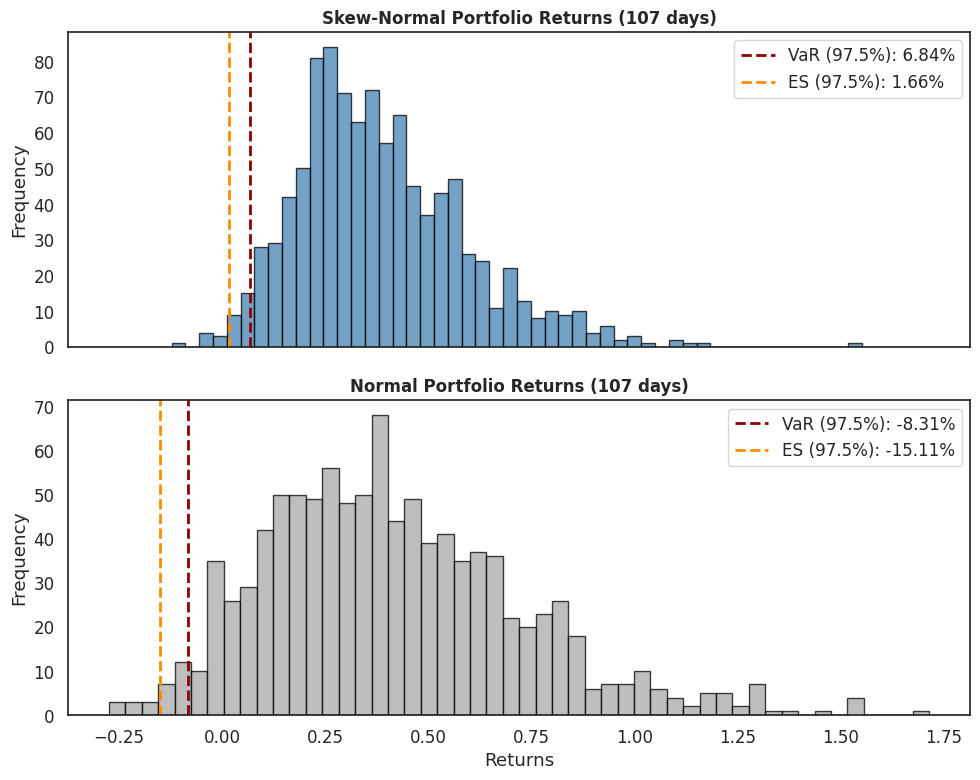

In [79]:
simulator.VaR_and_plot()

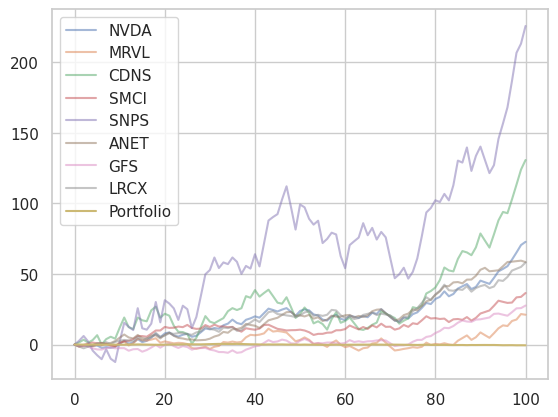

In [ ]:
first_ = []
for asset in assets_prices:
  asst=[]
  asst = np.array(asset[0])
  first_.append(asst - asst[0])


for i, path in enumerate(first_):
  plt.plot(path, label = stock_list[i], alpha=0.5)
plt.plot(np.array(paths_skew[0])-paths_skew[0][0], label = "Portfolio")
plt.legend()
plt.show()

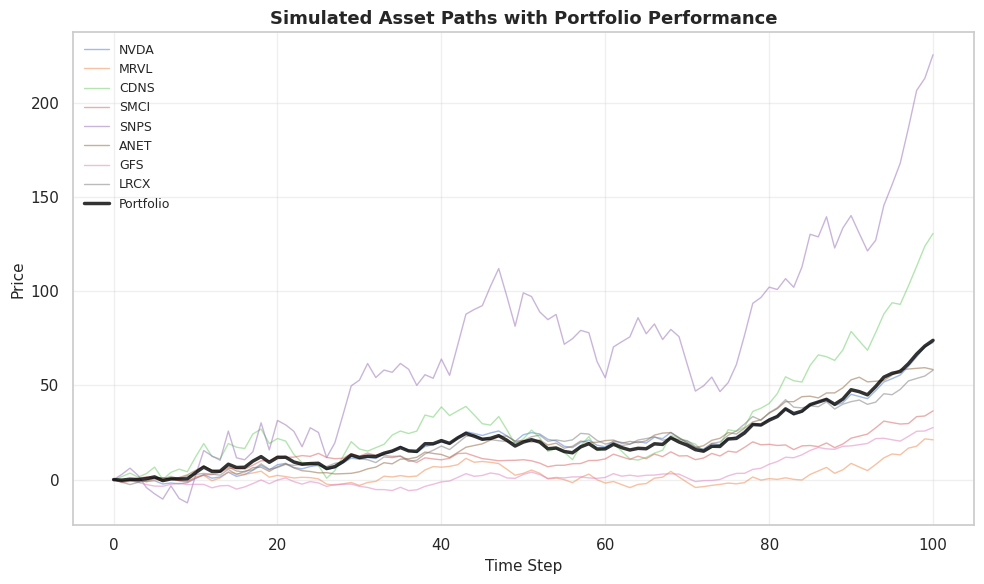

In [ ]:
# --- Setup ---
sns.set(style="whitegrid", font_scale=1.0)
colors = sns.color_palette("muted", n_colors=len(stock_list))

# --- Plot Setup ---
plt.figure(figsize=(10, 6))

# Plot each asset
for i, path in enumerate(first_):
    plt.plot(path, label=stock_list[i], color=colors[i], linewidth=1.0, alpha=0.5)

# Plot the portfolio path (difference between skewed and normal path[0] as per your code)
portfolio = np.array(paths_skew[0]) - paths_skew[0][0]
plt.plot(portfolio, label="Portfolio", color="black", linewidth=2.5, alpha=0.8)

# --- Formatting ---
plt.title("Simulated Asset Paths with Portfolio Performance", fontsize=13, weight='bold')
plt.xlabel("Time Step", fontsize=11)
plt.ylabel("Price", fontsize=11)
plt.legend(loc='upper left', fontsize=9, frameon=False)
plt.grid(True, alpha=0.3)
plt.tight_layout()

# --- Save to PDF ---
plt.savefig("portfolio_comparison_plot.pdf", bbox_inches='tight', dpi=300)
plt.show()

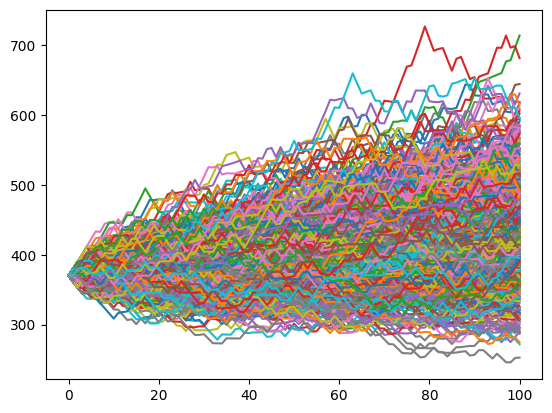

In [ ]:
for path in paths_van:
  plt.plot(path)
plt.show()

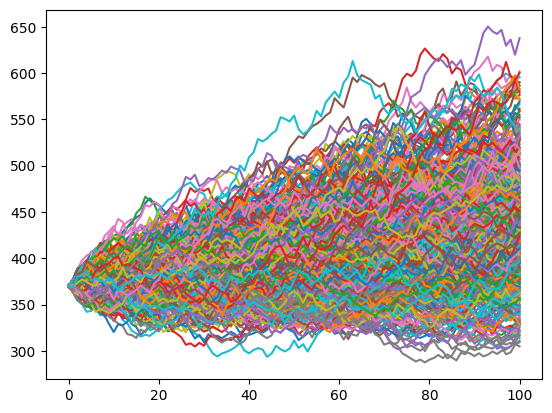

In [ ]:
[plt.plot(path) for path in paths_skew]
plt.show()

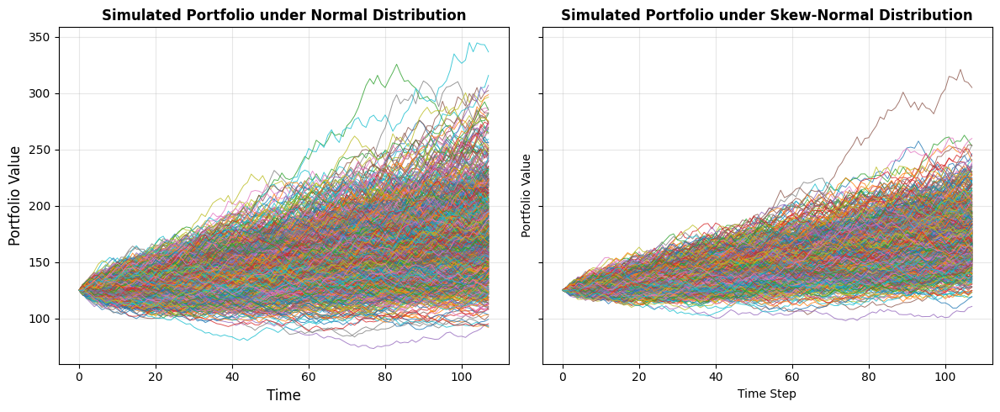

In [37]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharex=True, sharey=True)

# --- Normal Distribution Paths ---
for path in paths_van:
    axes[0].plot(path, linewidth=0.7, alpha=0.8)

axes[0].set_title("Simulated Portfolio under Normal Distribution", fontsize=12, weight='bold')
axes[0].set_ylabel("Portfolio Value", fontsize=12)
axes[0].set_xlabel("Time", fontsize=12)
axes[0].grid(True, alpha=0.3)

# --- Skew-Normal Distribution Paths ---
for path in paths_skew:
    axes[1].plot(path, linewidth=0.7, alpha=0.8)

axes[1].set_title("Simulated Portfolio under Skew-Normal Distribution", fontsize=12, weight='bold')
axes[1].set_xlabel("Time Step", fontsize=10)
axes[1].set_ylabel("Portfolio Value", fontsize=10)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig("portfolio_paths_comparison.png", bbox_inches='tight', dpi = 300)
plt.show()

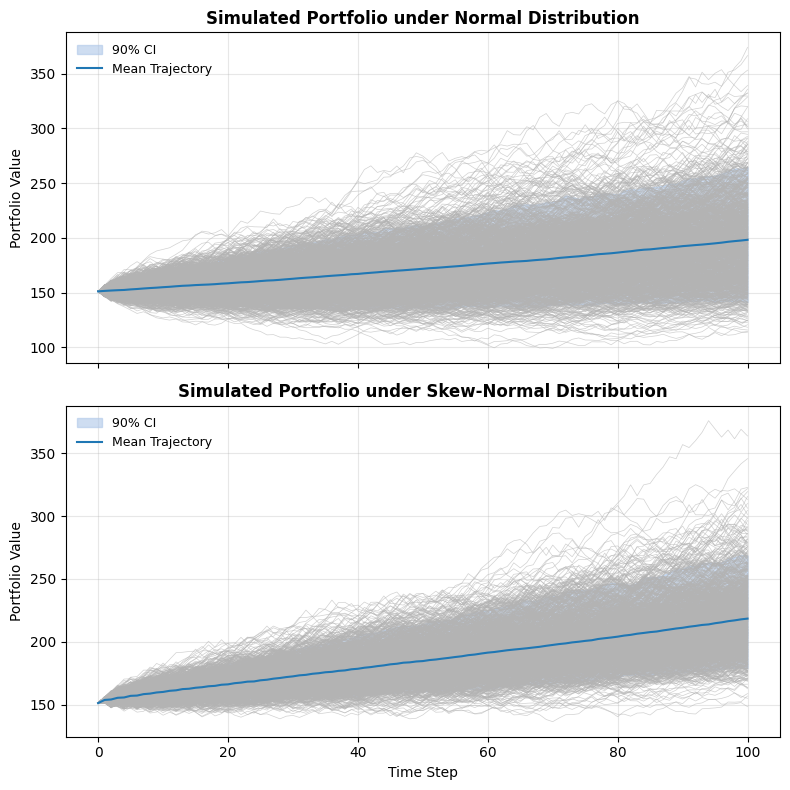

In [15]:
def plot_paths_with_ci(paths, ax, title):
    paths = np.array(paths)  # shape (N, T)
    mean_path = np.mean(paths, axis=0)
    lower = np.percentile(paths, 5, axis=0)
    upper = np.percentile(paths, 95, axis=0)

    # Elegant color palette
    path_color = "#b3b3b3"       # soft gray for paths
    mean_color = "#1f77b4"       # muted blue
    fill_color = "#aec7e8"       # lighter blue for CI

    # Plot individual paths
    for path in paths:
        ax.plot(path, color=path_color, linewidth=0.5, alpha=0.6)

    # Confidence interval fill
    ax.fill_between(np.arange(paths.shape[1]), lower, upper,
                    color=fill_color, alpha=0.6, label="90% CI")

    # Mean trajectory
    ax.plot(mean_path, color=mean_color, linewidth=1.5, label="Mean Trajectory")

    # Styling
    ax.set_title(title, fontsize=12, weight='bold')
    ax.set_ylabel("Portfolio Value", fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper left', fontsize=9, frameon=False)

# --- Combined Plotting ---
fig, axes = plt.subplots(2, 1, figsize=(8, 8), sharex=True)

# Plot Normal
plot_paths_with_ci(paths_van, axes[0], "Simulated Portfolio under Normal Distribution")

# Plot Skew-Normal
plot_paths_with_ci(paths_skew, axes[1], "Simulated Portfolio under Skew-Normal Distribution")

axes[1].set_xlabel("Time Step", fontsize=10)
plt.tight_layout()
plt.savefig("portfolio_paths_elegant.pdf", bbox_inches='tight', dpi=300)
plt.show()


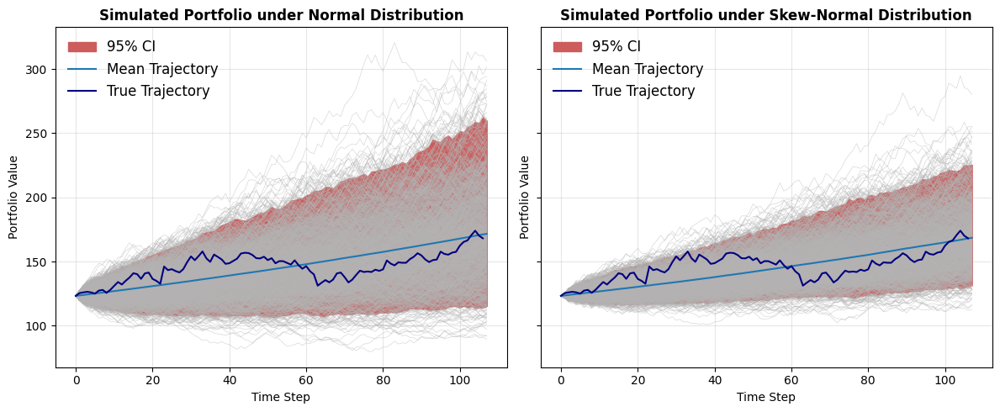

In [43]:
def plot_paths_with_ci(paths, ax, title):
    paths = np.array(paths)  # shape: (N, T)
    mean_path = np.mean(paths, axis=0)
    trtest = datahub.ts_train_test_split(0.25)
    test = []
    for tr in trtest:
      test.append(tr[1])

    test = np.array(test).T
    weights = datahub.max_shr_portfolio[0]
    graph_true = np.inner(test, np.array(weights))
    lower = np.percentile(paths, 2.5, axis=0)
    upper = np.percentile(paths, 98, axis=0)

    # Elegant color palette
    path_color = "#b3b3b3"       # soft gray
    mean_color = "#1f77b4"       # blue
    fill_color = "indianred"       # light blue

    # Confidence interval
    ax.fill_between(np.arange(paths.shape[1]), lower, upper,
                    color=fill_color, alpha=1, label="95% CI")

    # Plot individual paths
    for path in paths:
        ax.plot(path, color=path_color, linewidth=0.5, alpha=0.5)


    # Mean path
    ax.plot(mean_path, color=mean_color, linewidth=1.5, label="Mean Trajectory")

    # True path
    ax.plot(graph_true, color='navy', linewidth=1.5, label="True Trajectory")

    # Aesthetics
    ax.set_title(title, fontsize=12, weight='bold')
    ax.set_xlabel("Time Step", fontsize=10)
    ax.set_ylabel("Portfolio Value", fontsize=10)
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper left', fontsize=12, frameon=False)

# --- Side-by-side plots ---
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

plot_paths_with_ci(paths_van, axes[0], "Simulated Portfolio under Normal Distribution")
plot_paths_with_ci(paths_skew, axes[1], "Simulated Portfolio under Skew-Normal Distribution")

plt.tight_layout()
plt.savefig("portfolio_paths_side_by_side.png", bbox_inches='tight', dpi=300)
plt.show()

In [ ]:
dh_param_gbm = datahub.get_gbm_params[1][:,0]
np.inner(dh_param_gbm, np.array(weights))

np.float64(77.21840186130477)

In [ ]:
seeds = simulator.seeds_
corr_mat = datahub.get_corr
deltas = datahub.get_deltas
stock_list = datahub.stocklist_

# skewed
main_asset_paths = simulator.bm_skew_v2(delta = deltas[0], seed1 = seeds[0][0], seed2 = seeds[0][1])[0]
# standard
following_assets_paths = [simulator.bm_skew_v2(delta = deltas[i], seed1 = seeds[i][0], seed2 = seeds[i][1])[1] for i in range(1, len(stock_list))]
assets_paths = [main_asset_paths] + following_assets_paths

order_matched_paths = []
for i in range(0, simulator.N_):
  paths_i = []
  for asset in assets_paths:
    asset = np.array(asset)
    path_i_in_asset = asset.T[:, i]
    paths_i.append(path_i_in_asset)
  order_matched_paths.append(np.array(paths_i))

# order_matched_correlated = []
# for paths in order_matched_paths:
#   paths_i = []
#   for i in range(0, len(datahub.stocklist_)):
#     skewed = paths.T[:, 0]
#     path_i_in_asset = paths.T[:, i]
#     corr = corr_mat[0][i]
#     corr_i_in_asset = corr * skewed + np.sqrt((1 - 2 * deltas[0]**2 / np.pi) * (1 - corr**2)) * path_i_in_asset
#     paths_i.append(corr_i_in_asset)
#   order_matched_correlated.append(np.array(paths_i))

# assets = []
# for i in range(0, len(stock_list)):
#   asset = []
#   for paths in order_matched_correlated:
#     asset_i_path_j = paths.T[:,i]
#     asset.append(asset_i_path_j)
#   assets.append(asset)

In [44]:
corr = datahub.get_corr

In [46]:
import seaborn as sns

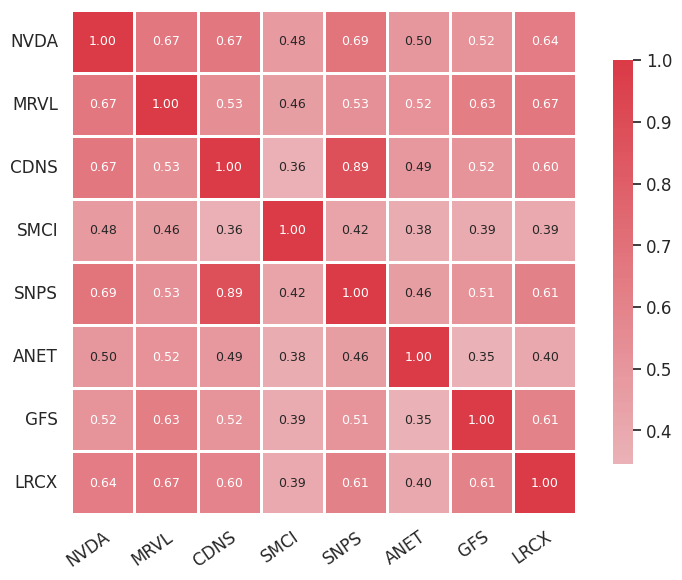

In [47]:
# Convert to DataFrame for better labeling
df_corr = pd.DataFrame(corr, index=stock_list, columns=stock_list)

# Plot settings
plt.figure(figsize=(8, 6))
sns.set(style="white", font_scale=1.1)
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Create heatmap
ax = sns.heatmap(df_corr, annot=True, fmt=".2f", cmap=cmap, center=0,
                  square=True, linewidths=0.75, cbar_kws={"shrink": 0.8},
                  annot_kws={"size": 9})

plt.xticks(rotation=35, ha='right', rotation_mode='anchor')
plt.yticks(rotation=0)
plt.tight_layout()
plt.savefig('corr.png', dpi = 300)
plt.show()

In [ ]:
corr_paths = simulator.corr_paths

In [ ]:
portfolio_sim_paths = simulator.sgbm_portfolio

--------------------------------------------------------------------------------
Max Sharpe Ratio Allocation

Expected Return: 0.9266
Volatility: 0.3691


             NVDA      MRVL      CDNS      SMCI      SNPS      ANET       GFS  \
weights  0.337989  0.005811  0.189995  0.178699  0.042703  0.144439  0.004576   

             LRCX  
weights  0.095788  
--------------------------------------------------------------------------------
Min Variance Allocation

Expected Return: 0.4844
Volatility: 0.2854


             NVDA      MRVL      CDNS      SMCI      SNPS      ANET       GFS  \
weights  0.020868  0.007818  0.273184  0.004365  0.295947  0.132047  0.106746   

             LRCX  
weights  0.159024  
--------------------------------------------------------------------------------
Individual Stock Returns and Volatility

NVDA : annualised return 1.25495 , annualised volatility: 0.49023
MRVL : annualised return 0.4207 , annualised volatility: 0.54095
CDNS : annualised return 0.46584 , 

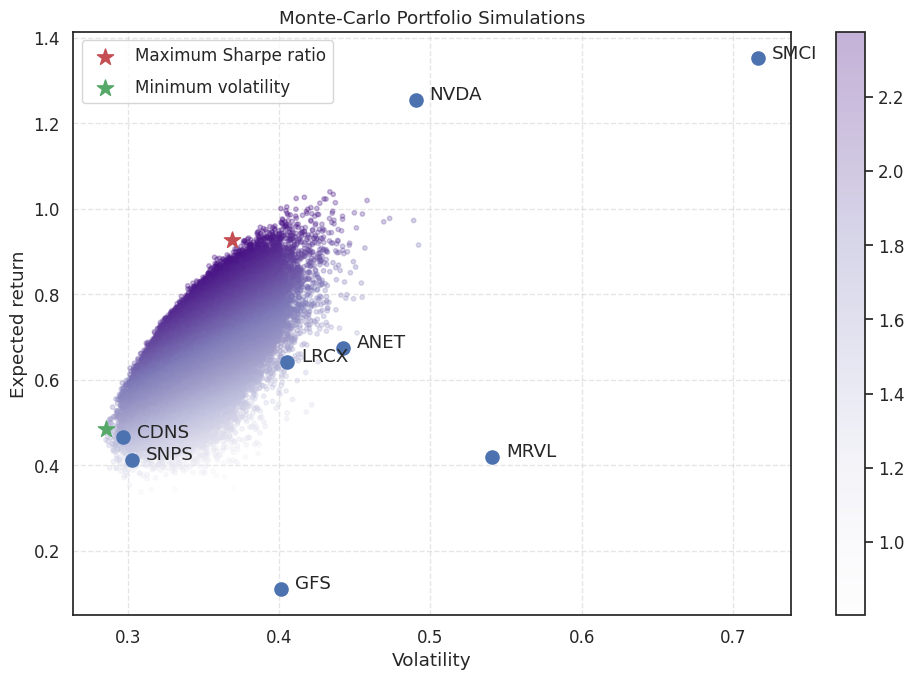

In [48]:
datahub.display_random_portfolios()

In [ ]:
plt.savefig('ef.png')

<Figure size 640x480 with 0 Axes>

In [51]:
simulator.VaR_and_plot

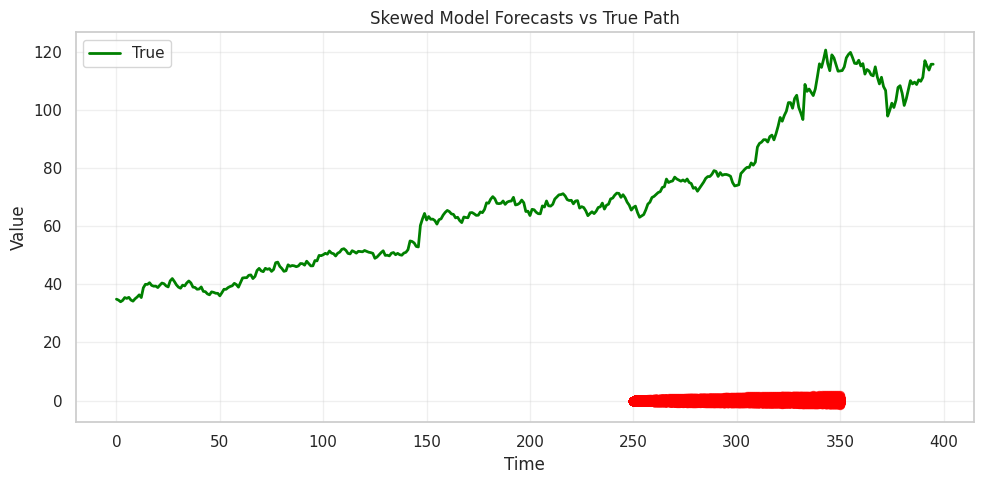

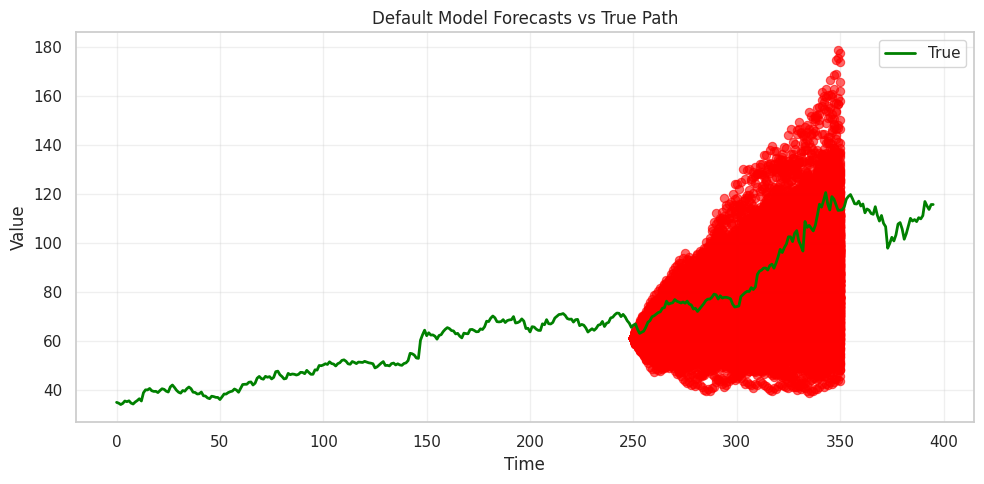

In [ ]:
# --- Time Axis ---
t_all = np.linspace(250, 350, 101)

# --- Combine Train + Prediction ---
train_and_pred_sk = paths_skew
train_and_pred_def = paths_van
graph_true = datahub.get_close
graph_true = np.inner(np.array(graph_true).T, np.array(weights))

# --- Plot 1: Skewed Model ---
plt.figure(figsize=(10, 5))
for path in train_and_pred_sk:
    plt.scatter(x = t_all, y = path, color='red', alpha=0.6, linewidth=0.8, label='_nolegend_')
plt.plot(graph_true, color='green', linewidth=2.0, label='True')
plt.title("Skewed Model Forecasts vs True Path")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("forecast_skewed_model.pdf", dpi=300)
plt.show()

# --- Plot 2: Default Model ---
plt.figure(figsize=(10, 5))
for path in train_and_pred_def:
    plt.scatter(x = t_all, y = path, color='red', alpha=0.6, linewidth=0.8, label='_nolegend_')
plt.plot(graph_true, color='green', linewidth=2.0, label='True')
plt.title("Default Model Forecasts vs True Path")
plt.xlabel("Time")
plt.ylabel("Value")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig("forecast_default_model.pdf", dpi=300)
plt.show()

In [ ]:
weights = datahub.max_shr_portfolio[0]
for i, true in enumerate(graph true):
  weights[i] * tr


array([0.44266088, 0.01242726, 0.07709352, 0.17554472, 0.02148374,
       0.16716575, 0.02208129, 0.08154285])

In [ ]:
np.inner(np.array(graph_true).T, np.array(weights))

array([ 34.9010943 ,  34.57512474,  34.01320438,  34.48161354,
        35.4486309 ,  35.17679006,  35.52919495,  34.60542339,
        34.2265447 ,  35.03639701,  35.62751724,  36.38562658,
        35.45667533,  38.82114315,  40.01559858,  39.99146577,
        40.57477832,  39.66106893,  39.37622612,  39.40302935,
        38.90106849,  39.73822614,  40.45732927,  40.20993865,
        39.48041367,  39.12318966,  41.22219836,  41.99655067,
        40.99704176,  39.83326471,  39.0371694 ,  38.67336235,
        39.73503447,  39.46992996,  40.49655474,  41.16893818,
        40.49453532,  39.06596467,  38.93822076,  38.3196743 ,
        38.40295855,  39.11699001,  37.59775132,  37.47678799,
        36.72263383,  36.41004744,  37.41076126,  37.24229039,
        36.94436141,  36.90773556,  36.0547359 ,  37.13481286,
        38.30727541,  38.29842028,  38.90067613,  39.27228741,
        39.50948022,  40.35331893,  39.91572053,  39.04075648,
        40.59311098,  42.19438074,  42.29075322,  42.30

<h2>brutforce approach<h2>

In [ ]:
# # skewed random walk -> skewed bm through limiting procedure    #can we apply limiting procedure here? YES, proved by Y Lyulko
# def skew_bm_simulations(p, a, T, granularity, N):
#     random.seed(seed)
#     n_steps = T*granularity
#     paths = []
#     increments = []
#     for _ in range(0, N):
#         path = []
#         for _ in range(0, n_steps):
#             if np.sum(np.array(path)) ==  0:
#                 step = random.choices([1, -1], weights = [a, 1-a], k = 1)[0]
#             else:
#                 step = random.choices([1, -1], weights = [p, 1-p], k = 1)[0]
#             path.append(step)
#         path = np.cumsum(np.insert(path, 0, 0))/np.sqrt(granularity)
#         paths.append(path)

#     return paths

In [ ]:
# msft = yf.Ticker("MSFT")
# aapl = yf.Ticker("AAPL")
# nvda = yf.Ticker("NVDA")

<h2>RESEARCH ON SKEWNORMAL<h2>

In [ ]:
session = requests.Session(impersonate="chrome")

start_ = "2022-10-22"
end_ = "2024-05-22"
inter_ = '1d'

# for AAPL
# start_ = "2022-12-27"

nvda = yf.Ticker('NVDA', session=session)
close_nvda = np.array(nvda.history(start = start_, end = end_, interval = inter_)['Close'].reset_index(drop=True))
returns_nvda = np.log(close_nvda[1:]/close_nvda[:-1])

aapl = yf.Ticker('AAPL', session=session)
close_aapl = np.array(aapl.history(start = start_, end = end_, interval = inter_)['Close'].reset_index(drop=True))
returns_aapl = close_aapl[1:]/close_aapl[:-1] - 1

msft = yf.Ticker('MSFT', session=session)
close_msft = np.array(msft.history(start = start_, end = end_, interval = inter_)['Close'].reset_index(drop=True))
returns_msft = close_msft[1:]/close_msft[:-1] - 1

**FIT OF BEST DICTIONARY DIST**

[28-05-2025 18:10:11] [distfit.distfit] [INFO] fit
[28-05-2025 18:10:11] [distfit.distfit] [INFO] transform
[28-05-2025 18:10:11] [distfit.distfit] [INFO] [norm      ] [0.00 sec] [RSS: 27.5705] [loc=0.005 scale=0.031]
[28-05-2025 18:10:11] [distfit.distfit] [INFO] [expon     ] [0.00 sec] [RSS: 792.513] [loc=-0.105 scale=0.111]
[28-05-2025 18:10:11] [distfit.distfit] [INFO] [pareto    ] [0.01 sec] [RSS: 792.513] [loc=-16777216.105 scale=16777216.000]
[28-05-2025 18:10:11] [distfit.distfit] [INFO] [dweibull  ] [0.04 sec] [RSS: 23.723] [loc=0.005 scale=0.023]
[28-05-2025 18:10:11] [distfit.distfit] [INFO] [t         ] [0.22 sec] [RSS: 14.5389] [loc=0.004 scale=0.023]
[28-05-2025 18:10:12] [distfit.distfit] [INFO] [genextreme] [0.41 sec] [RSS: 38.445] [loc=-0.008 scale=0.029]
[28-05-2025 18:10:12] [distfit.distfit] [INFO] [gamma     ] [0.13 sec] [RSS: 919.744] [loc=-0.105 scale=0.380]
[28-05-2025 18:10:12] [distfit.distfit] [INFO] [lognorm   ] [0.12 sec] [RSS: 18.9615] [loc=-0.253 scale=0.

1.2633454704563372 excess skew nvda
7.121861748239615 excess kurtosis nvda
0.0004418169512372603 excess skew norm
-0.006055860768315213 excess kurtosis norm


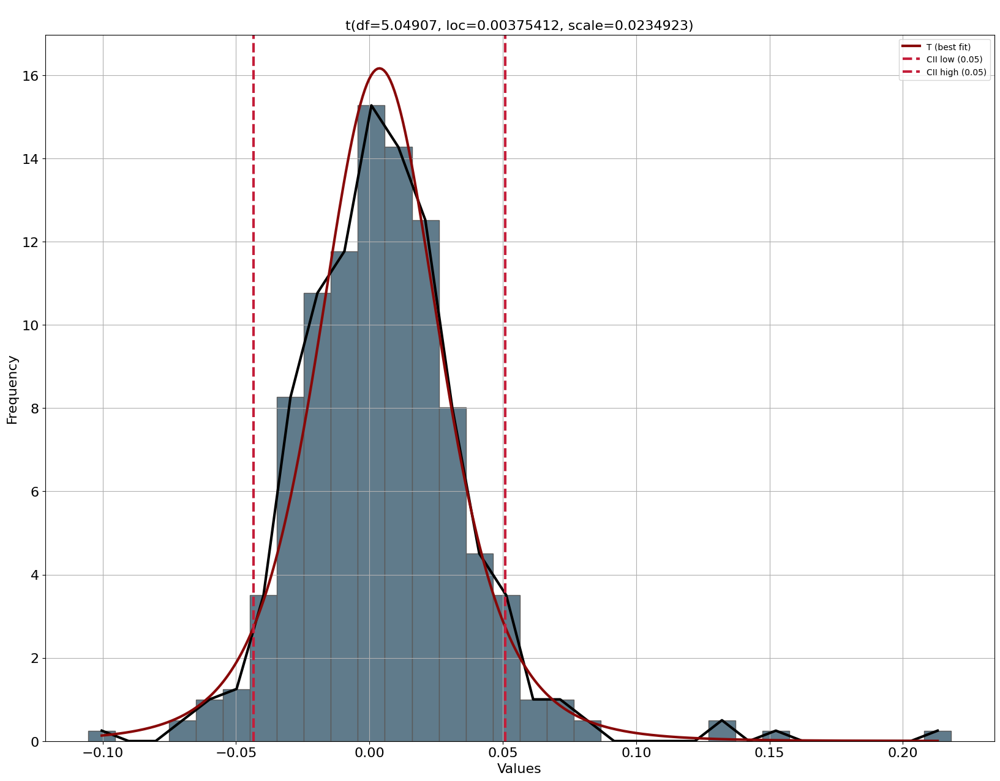

In [ ]:
# Initialize distfit
dist = distfit()
# Determine best-fitting probability distribution for data
distfit_ = dist.fit_transform(returns_nvda)
dist.plot()
params_t = distfit_["model"]["params"]

normal = np.random.normal(0, 1, 1000000)
print(skew(returns_nvda), 'excess skew nvda')
print(kurtosis(returns_nvda), 'excess kurtosis nvda')
print(skew(normal), 'excess skew norm')
print(kurtosis(normal), 'excess kurtosis norm')

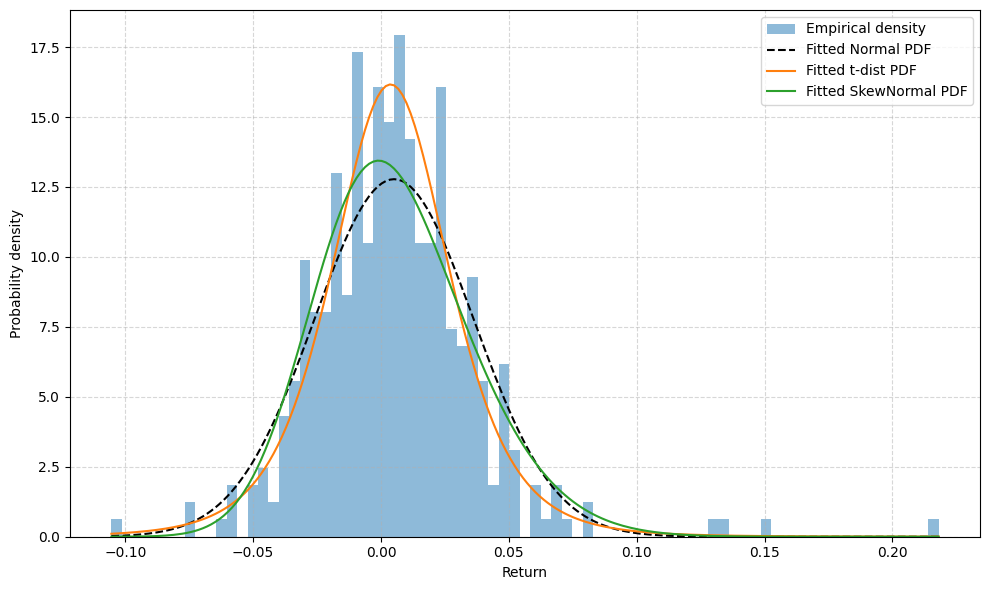

0.8707083456159113 delta_mle


In [ ]:
shape_, loc_, scale_ = skewnorm.fit(returns_nvda)
delta_mle = shape_ / np.sqrt(1+shape_**2)

# example data
bins = np.linspace(returns_nvda.min(), returns_nvda.max(), 80)

plt.figure(figsize=(10,6))
# empirical density
plt.hist(returns_nvda,
         bins=bins,
         density=True,
         alpha=0.5,
         label='Empirical density')
# fitted normal PDF
mu, sigma = returns_nvda.mean(), returns_nvda.std(ddof=1)
x = np.linspace(bins.min(), bins.max(), 200)
plt.plot(x, norm.pdf(x, mu, sigma), 'k--', label='Fitted Normal PDF')
plt.plot(x, t.pdf(x, df=params_t[0], loc=params_t[1], scale=params_t[2]), label='Fitted t-dist PDF')
plt.plot(x, skewnorm.pdf(x, shape_, loc=loc_, scale=scale_), label = 'Fitted SkewNormal PDF')

plt.xlabel('Return')
plt.ylabel('Probability density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.savefig('empirics.png')
plt.show()
print(delta_mle, 'delta_mle')

In [ ]:
sn_par = [shape_, loc_, scale_]
n_par = [0, mu, sigma]
params_t

results = {}

# Empirical
results["Empirical"] = {
    "skewness": skew(returns_nvda),
    "kurtosis": kurtosis(returns_nvda)  # excess
}

# Normal
normal_sample = norm.rvs(loc=n_par[0], scale=n_par[1], size=10**7)
results["Normal"] = {
    "skewness": skew(normal_sample),
    "kurtosis": kurtosis(normal_sample)
}

# t-Student
t_sample = t.rvs(df=params_t[0], loc=params_t[1], scale=params_t[2], size=10**7)
results["t-Student"] = {
    "skewness": skew(t_sample),
    "kurtosis": kurtosis(t_sample)
}

# Skew-Normal
sn_sample = skewnorm.rvs(a=sn_par[0], loc=sn_par[1], scale=sn_par[2], size=10**7)
results["Skew-Normal"] = {
    "skewness": skew(sn_sample),
    "kurtosis": kurtosis(sn_sample)
}

# === Display as Table ===
import pandas as pd
df_results = pd.DataFrame(results).T
print(df_results)

             skewness  kurtosis
Empirical    1.263345  7.121862
Normal      -0.000792  0.002314
t-Student   -0.008288  5.076777
Skew-Normal  0.385718  0.249758


In [ ]:
n_par

[0, np.float64(0.005126736264384264), np.float64(0.031218192162876218)]

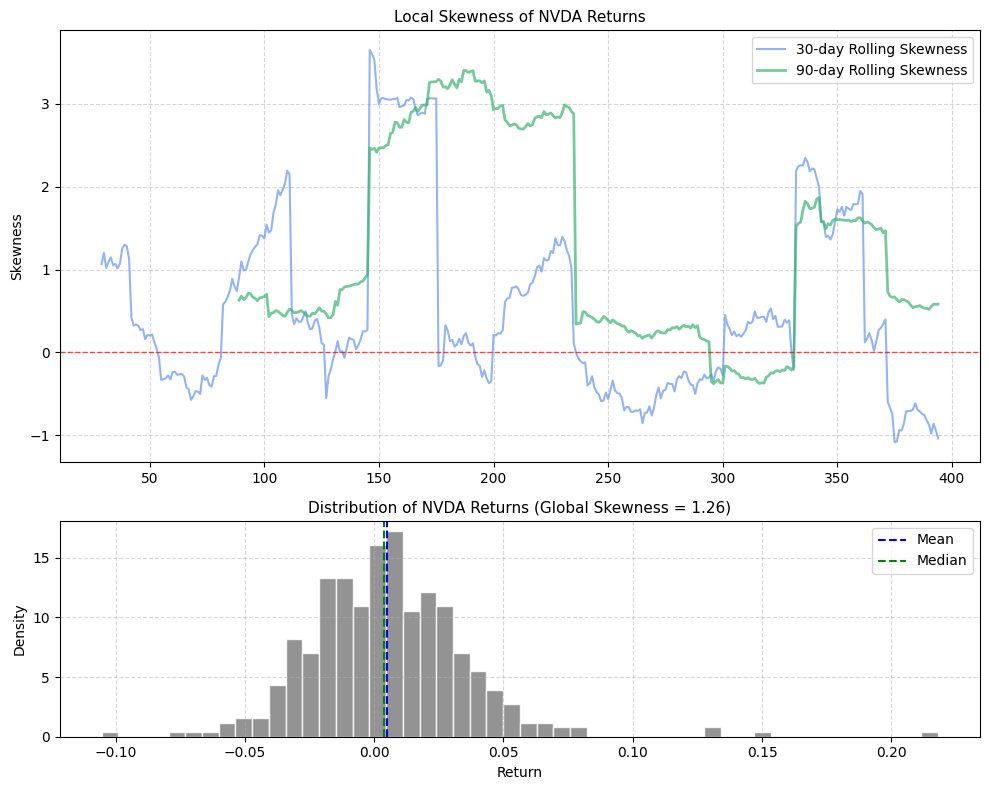

In [ ]:
# Assume: returns_nvda is your NumPy array of log-returns
returns_series = pd.Series(returns_nvda)

# Compute rolling skewness
rolling_skew_30 = returns_series.rolling(window=30).apply(lambda x: skew(x, bias=False), raw=False)
rolling_skew_90 = returns_series.rolling(window=90).apply(lambda x: skew(x, bias=False), raw=False)

# Setup plot
fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(10, 8), sharex=False, gridspec_kw={'height_ratios': [2, 1]})

# --- Top subplot: Rolling skewness ---
axs[0].plot(rolling_skew_30, label='30-day Rolling Skewness', color='cornflowerblue', alpha=0.7)
axs[0].plot(rolling_skew_90, label='90-day Rolling Skewness', color='mediumseagreen', alpha=0.7, linewidth=2)
axs[0].axhline(0, color='red', linestyle='--', linewidth=1, alpha=0.7)
axs[0].set_title('Local Skewness of NVDA Returns', fontsize=11)
axs[0].set_ylabel('Skewness')
axs[0].legend()
axs[0].grid(True, linestyle='--', alpha=0.5)

# --- Bottom subplot: Histogram of returns ---
axs[1].hist(returns_nvda, bins=50, color='gray', edgecolor='white', alpha=0.85, density=True)
axs[1].axvline(np.mean(returns_nvda), color='blue', linestyle='--', linewidth=1.5, label='Mean')
axs[1].axvline(np.median(returns_nvda), color='green', linestyle='--', linewidth=1.5, label='Median')
axs[1].set_title(f'Distribution of NVDA Returns (Global Skewness = {skew(returns_nvda):.2f})', fontsize=11)
axs[1].set_xlabel('Return')
axs[1].set_ylabel('Density')
axs[1].legend()
axs[1].grid(True, linestyle='--', alpha=0.5)

# Finalize layout
plt.tight_layout()
plt.savefig('nvda_skewness_analysis1.png', dpi=500)
plt.show()

**Q-Q PLOTS OF RETURNS VS DISTRIBUTIONS**

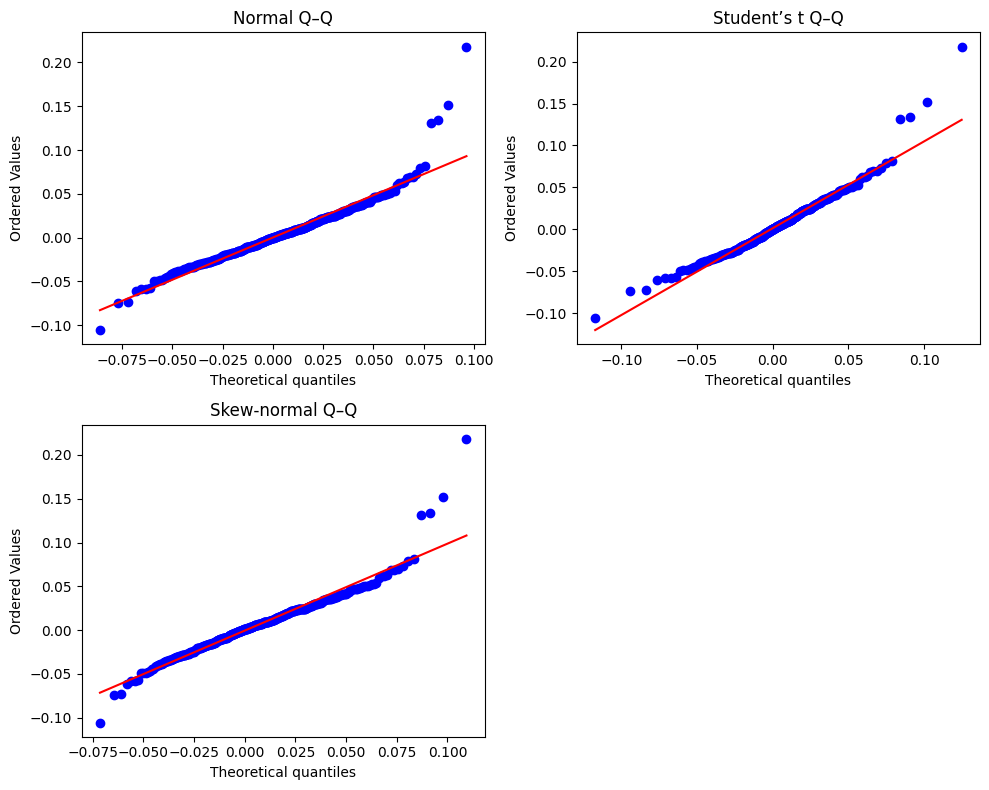

In [ ]:
# Create a 2×2 grid, leave one cell empty if you only have 3 plots
fig, axes = plt.subplots(2, 2,
                         figsize=(10, 8),
                         constrained_layout=False)   # we'll call tight_layout manually

# Top-left: Normal Q–Q
probplot(returns_nvda,
         dist='norm',
         sparams=(mu, sigma),
         plot=axes[0, 0])
axes[0, 0].set_title("Normal Q–Q")

# Top-right: Student’s t Q–Q
probplot(returns_nvda,
         dist='t',
         sparams=(params_t[0], params_t[1], params_t[2]),
         plot=axes[0, 1])
axes[0, 1].set_title("Student’s t Q–Q")

# Bottom-left: Skew‐normal Q–Q
probplot(returns_nvda,
         dist='skewnorm',
         sparams=(shape_, loc_, scale_),
         plot=axes[1, 0])
axes[1, 0].set_title("Skew-normal Q–Q")

# Bottom-right: optionally empty
axes[1, 1].axis('off')

# Adjust spacing manually
plt.tight_layout(pad=3.0,   # space around the figure border
                 w_pad=2.0, # width between subplots
                 h_pad=2.5) # height between subplots
plt.tight_layout()
plt.savefig('qq_nvda.png', dpi=300, bbox_inches='tight')
plt.show()

**KOLMOGOROV SMIRNOV TESTS**

In [ ]:
# 1. Run the KS tests
ks_norm = kstest(rvs=returns_nvda,
                 cdf='norm',
                 args=(mu, sigma))

ks_t    = kstest(rvs=returns_nvda,
                 cdf='t',
                 args=(params_t[0], params_t[1], params_t[2]))

ks_skew = kstest(rvs=returns_nvda,
                 cdf='skewnorm',
                 args=(shape_, loc_, scale_))

# 2. Assemble results into a list of dicts
results = [
    {
        'Distribution': 'Normal',
        'Parameters': f'μ={mu:.4f}, σ={sigma:.4f}',
        'D-statistic': ks_norm.statistic,
        'p-value': ks_norm.pvalue
    },
    {
        'Distribution': 'Student’s t',
        'Parameters': f'df={params_t[0]:.2f}, loc={params_t[1]:.4f}, scale={params_t[2]:.4f}',
        'D-statistic': ks_t.statistic,
        'p-value': ks_t.pvalue
    },
    {
        'Distribution': 'Skew-normal',
        'Parameters': f'α={shape_:.3f}, loc={loc_:.4f}, scale={scale_:.4f}',
        'D-statistic': ks_skew.statistic,
        'p-value': ks_skew.pvalue
    }
]

# 3. Create DataFrame and print
df = pd.DataFrame(results)
df

,Distribution,Parameters,D-statistic,p-value
0,Normal,"μ=0.0051, σ=0.0312",0.061567,0.096008
1,Student’s t,"df=5.05, loc=0.0038, scale=0.0235",0.030369,0.848411
2,Skew-normal,"α=1.770, loc=-0.0239, scale=0.0426",0.048499,0.300961


H0: Returns folllow Distribution

Got the controversial results. wtf I use SN if the t dist fits better. The only thing I mind, that in terms of BS model
the student may not be so suitable.

**JUST CHECK FOR SKEWNESS**

In [ ]:
# 1. Sample skewness
sample_skew = skew(returns_nvda, bias=False)

# 2. Theoretical skewness of each fitted law
skew_norm   = norm.stats(moments='s')                    # should be 0
skew_t      = t.stats(df=params_t[0], moments='s')       # Student’s t
skew_skewn  = skewnorm.stats(shape_, loc=loc_, scale=scale_, moments='s')

# 3. Bootstrap CI for sample skewness
def bootstrap_ci_skew(data, n_bootstrap=2000, alpha=0.05):
    n = len(data)
    boot_skews = np.empty(n_bootstrap)
    for i in range(n_bootstrap):
        sample = np.random.choice(data, size=n, replace=True)
        boot_skews[i] = skew(sample, bias=False)
    lower, upper = np.percentile(boot_skews, [100*alpha/2, 100*(1-alpha/2)])
    return lower, upper

ci_lower, ci_upper = bootstrap_ci_skew(returns_nvda)

# 4. Build results table
distros = [
    ("Normal", skew_norm),
    ("Student’s t", skew_t),
    ("Skew-normal", skew_skewn)
]

rows = []
for name, theo_sk in distros:
    diff = abs(theo_sk - sample_skew)
    within_ci = (ci_lower <= theo_sk <= ci_upper)
    rows.append({
        "Distribution": name,
        "Theoretical skew": f"{theo_sk:.4f}",
        "Sample skew": f"{sample_skew:.4f}",
        "Absolute diff": f"{diff:.4f}",
        "Within 95% CI": "yes" if within_ci else "no"
    })

df = pd.DataFrame(rows)
print(f"\nBootstrap 95% CI for sample skewness: [{ci_lower:.4f}, {ci_upper:.4f}]")
df


Bootstrap 95% CI for sample skewness: [0.0665, 2.2000]


,Distribution,Theoretical skew,Sample skew,Absolute diff,Within 95% CI
0,Normal,0.0000,1.2682,1.2682,no
1,Student’s t,0.0000,1.2682,1.2682,no
2,Skew-normal,0.3867,1.2682,0.8814,yes


<h2>Build Skewed Brownian Motion<h2>

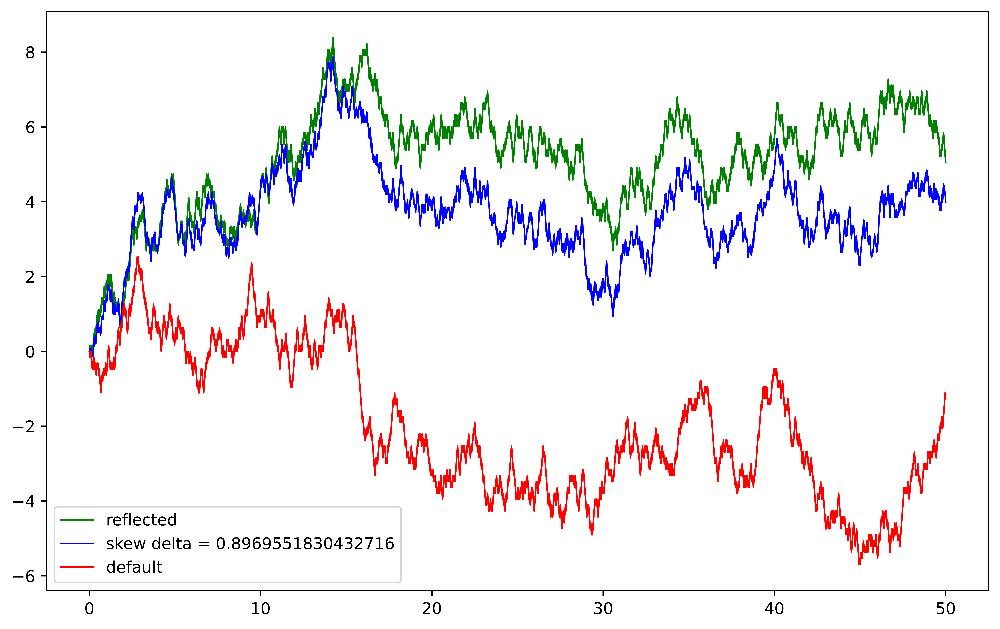

In [ ]:
delta = delta_mle
S0 = 0
T = 50
granularity = 40
N = 1

# paths = bm_simulations(p, S0, T, granularity, N)
paths_skew, paths, paths_reflected = bm_skew_v2(delta, S0, T, granularity, N, seed1, seed2)
# paths_reflected = bm_reflected(p, S0, T, granularity, N)
# type(paths_skew)
thkn = 1
fig = plt.gcf()
fig.set_size_inches(10.5, 6.5, forward=True)
fig.set_dpi(1000)

t_ = np.linspace(0, T, T*granularity + 1)
[plt.plot(t_, paths_reflected[i], 'green', linewidth = thkn) for i,j in enumerate(paths_reflected)]
[plt.plot(t_, paths_skew[i], 'blue', linewidth = thkn) for i,j in enumerate(paths_skew)]
[plt.plot(t_, paths[i],'red', linewidth = thkn) for i,j in enumerate(paths)]
plt.legend(['reflected',"skew delta = "+str(delta), 'default'])
plt.savefig('foo.png')
# plt.show()

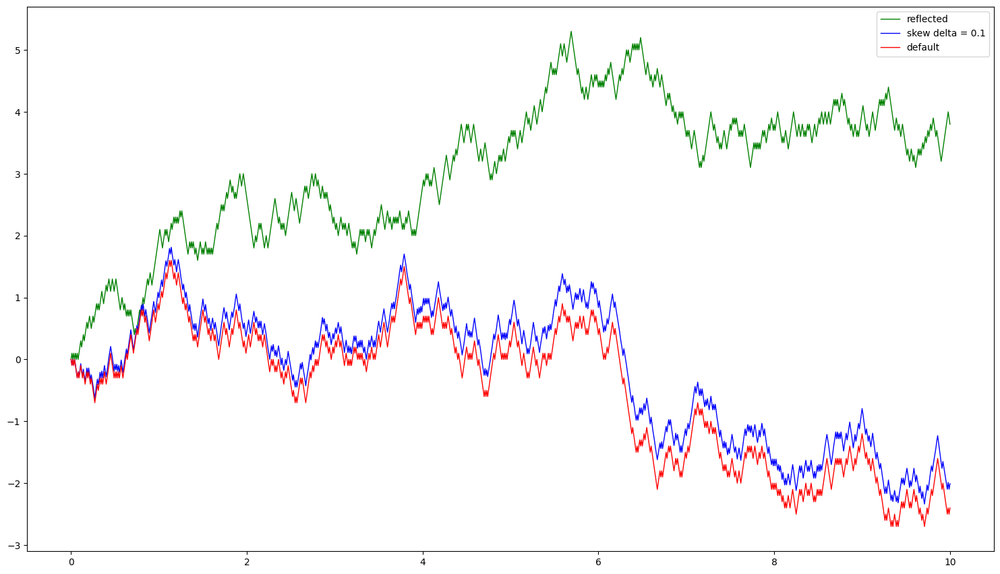

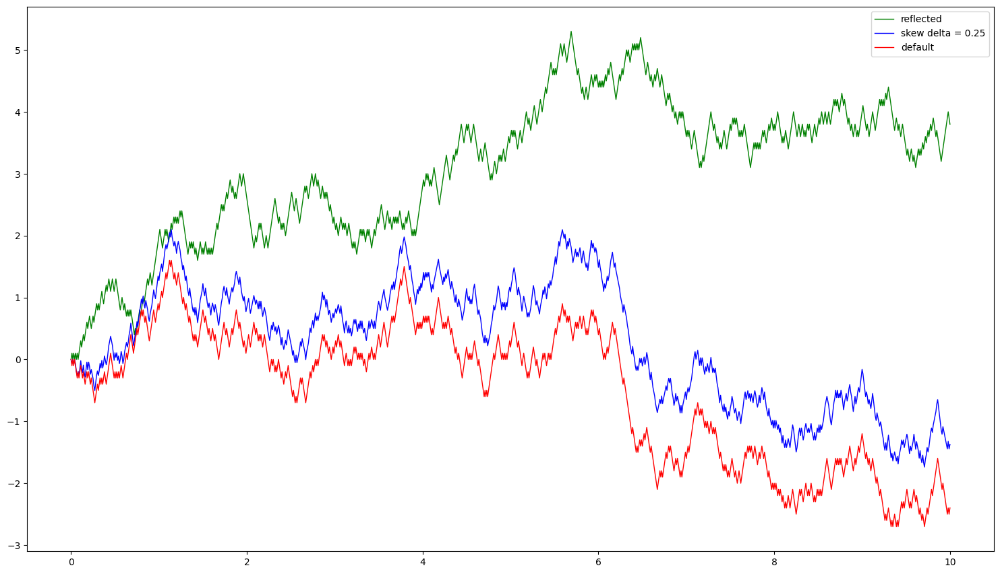

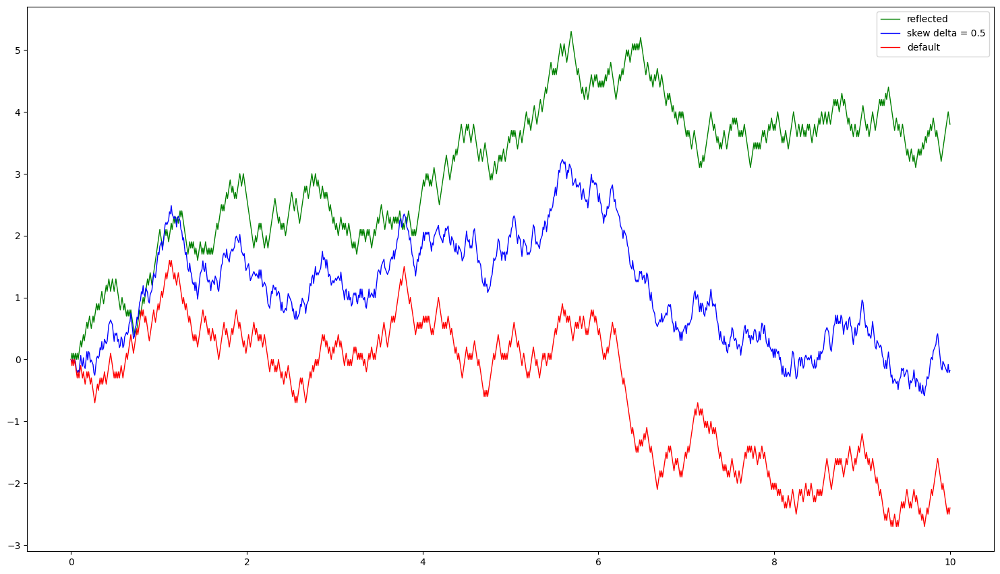

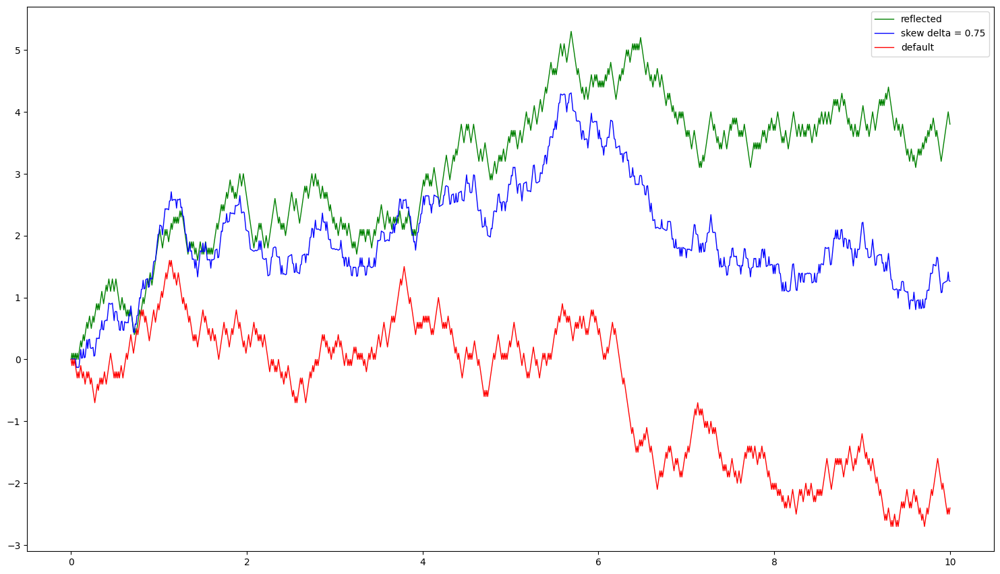

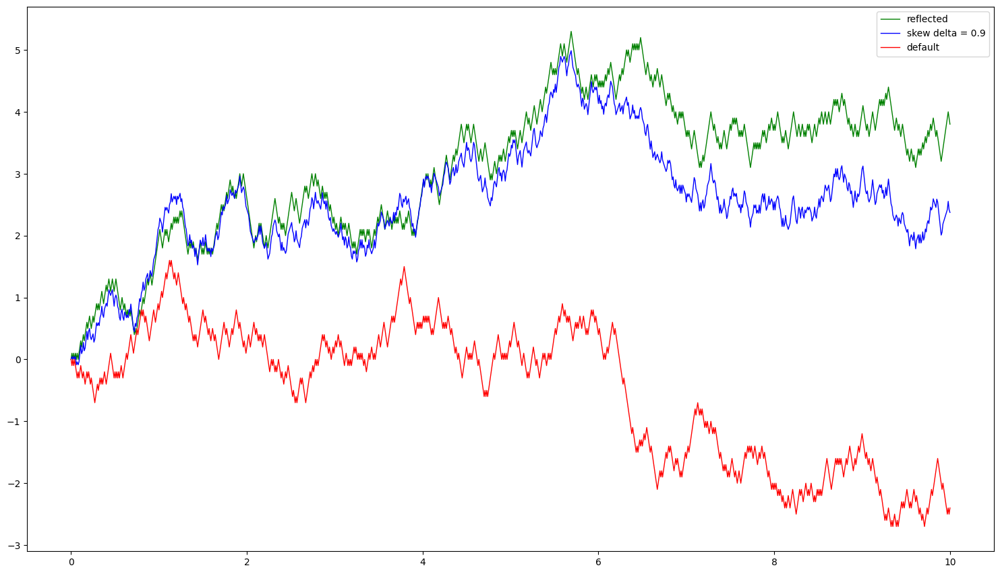

In [ ]:
deltas = [0.1, 0.25, 0.5, 0.75, 0.9]
S0 = 0
T = 10
N = 1
granularity = 100
t_ = np.linspace(0, T, T*granularity + 1)


for delta in deltas:
    fig = plt.gcf()
    fig.set_size_inches(18.5, 10.5, forward=True)
    paths_skew, paths, paths_reflected = bm_skew_v2(delta, S0, T, granularity, N, seed1, seed2)
    [plt.plot(t_, paths_reflected[i], 'green', linewidth = thkn) for i,j in enumerate(paths_reflected)]
    [plt.plot(t_, paths_skew[i], 'blue', linewidth = thkn) for i,j in enumerate(paths_skew)]
    [plt.plot(t_, paths[i],'red', linewidth = thkn) for i,j in enumerate(paths)]
    plt.legend(['reflected',"skew delta = "+str(delta), 'default'])
    plt.show()

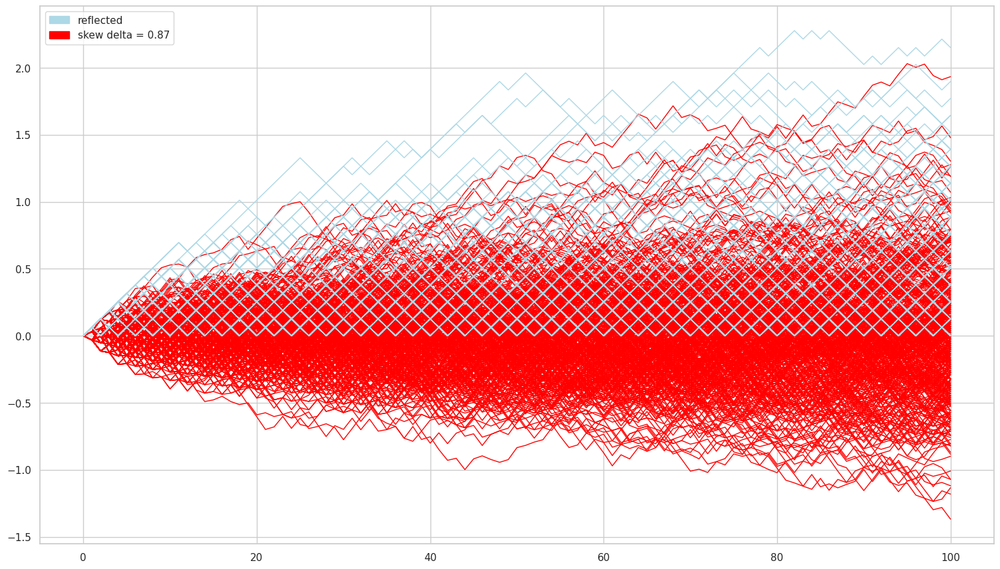

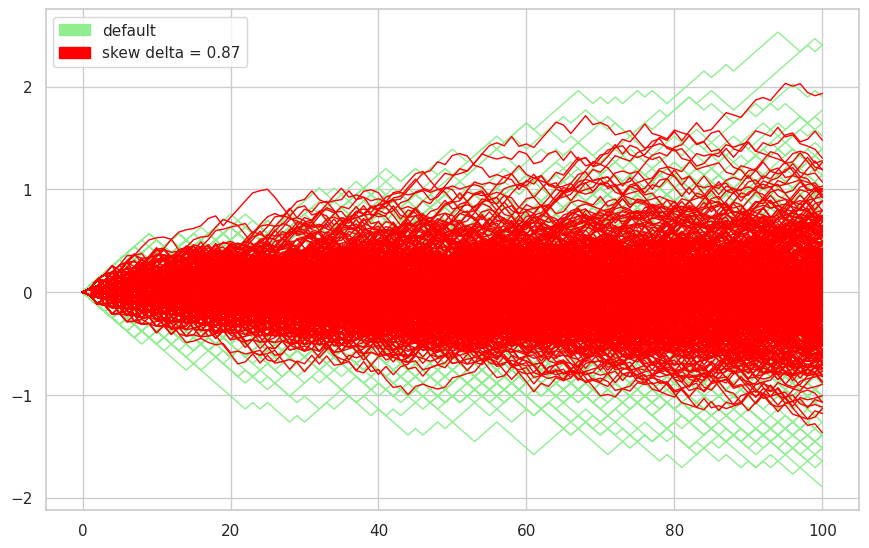

In [ ]:
fig = plt.gcf()
fig.set_size_inches(18.5, 10.5, forward=True)
paths_skew, paths, paths_reflected = simulator.bm_skew_v2(delta, 1, 2)
[plt.plot(paths_skew[i], 'red', linewidth = thkn) for i,j in enumerate(paths_skew)]
[plt.plot(paths_reflected[i], 'lightblue', linewidth = thkn) for i,j in enumerate(paths_reflected)]
blue_patch = mpatches.Patch(color='lightblue', label='reflected')
red_patch = mpatches.Patch(color='red', label='skew delta = '+str(delta))
plt.legend(handles=[blue_patch, red_patch])
plt.show()

fig = plt.gcf()
fig.set_size_inches(10.5, 6.5, forward=True)
[plt.plot(paths[i],'lightgreen', linewidth = thkn) for i,j in enumerate(paths)]
[plt.plot(paths_skew[i], 'red', linewidth = thkn) for i,j in enumerate(paths_skew)]
green_patch = mpatches.Patch(color='lightgreen', label='default')
plt.legend(handles=[green_patch, red_patch])
# plt.savefig('goo.png')
plt.show()

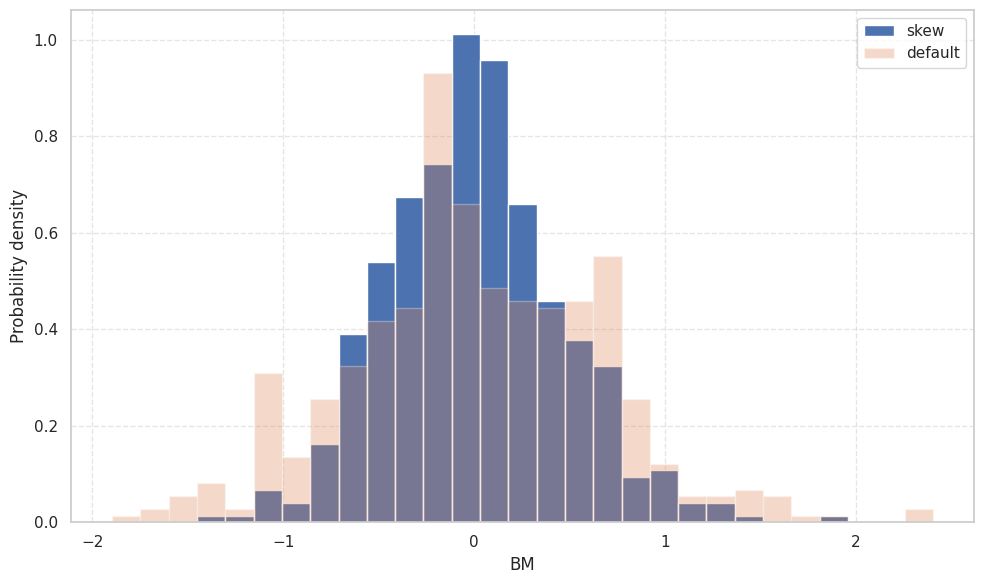

In [ ]:
last_skew = np.array([paths_skew[i][-1] for i in range(0, len(paths_skew))])
last_def = np.array([paths[i][-1] for i in range(0, len(paths))])

# example data
bins = np.linspace(last_def.min(), last_def.max(), 30)

plt.figure(figsize=(10,6))
# empirical density
plt.hist(last_skew,
         bins=bins,
         density=True,
         alpha=1,
         label='skew')

plt.hist(last_def,
         bins=bins,
         density=True,
         alpha=0.3,
         label='default')

plt.xlabel('BM')
plt.ylabel('Probability density')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [ ]:
train_set, test_set = ts_train_test_split(close_nvda, 0.25)

S0 = test_set[0]
T = np.round(len(train_set)/250, 2)
T_test = np.round(len(test_set)/250, 2)
T_all = np.round(len(close_nvda)/250, 2)
N = 200
granularity = 250

t_train = np.linspace(0, T, int(T*granularity)+1)
t_test = np.linspace(0, T_test, int(T_test*granularity)+1)

dt = 1/granularity

mu_head = np.mean(np.log(train_set[1:]/train_set[:-1]))
sigma_head = np.std(np.log(train_set[1:]/train_set[:-1]), ddof = 1)

sigma_ = sigma_head / np.sqrt(dt)
mu_ = mu_head / dt + 0.5 * sigma_**2

# delta = delta_mle
delta = delta_mle

ln_sk, ln_df = gbm_sk_df(delta, S0, T_test, granularity, N, mu_, sigma_, seed1, seed2)

In [ ]:
mu_, sigma_

(np.float64(1.278508858872652), np.float64(0.4936343721524315))

In [ ]:
pred_sk = [S0*np.exp(sk) for sk in ln_sk]
pred_df = [S0*np.exp(df) for df in ln_df]

t_all = np.linspace(0, T_all, int(T_all*granularity)+1)[:-1]

train_and_pred_sk = []
for p_sk in pred_sk:
    cnc = np.concatenate((train_set, p_sk), axis=None)
    train_and_pred_sk.append(cnc)

train_and_pred_def = []
for p_df in pred_df:
    cnc = np.concatenate((train_set, p_df), axis=None)
    train_and_pred_def.append(cnc)

graph_true = close_nvda[:-1]


plot = go.Figure()
[plot.add_scatter(x=t_all, y = tps, marker = {'color' : 'red'}) for tps in train_and_pred_sk]
plot.add_scatter(x=t_all, y = graph_true, marker = {'color' : 'green'})
plot.show()

plot1 = go.Figure()
[plot1.add_scatter(x=t_all, y = tpd, marker = {'color' : 'red'}) for tpd in train_and_pred_def]
plot1.add_scatter(x=t_all, y = graph_true, marker = {'color' : 'green'})
plot1.show()

print("1st picture skewed, 2nd picture default")

1st picture skewed, 2nd picture default


<h2>CORRELATED SKEW BROWNIAN MOTIONS<h2>
Need to fix the rvs function

In [ ]:
seed1 = 1
seed2 = 2
seed3 = 3
seed4 = 4

In [ ]:
# parameters tuple (shape, loc, scale)
param1 = skewnorm.fit(returns_nvda)
param2 = skewnorm.fit(returns_aapl)

# corr coefficient rho, just value not matrix type
rho_ = np.corrcoef(returns_nvda, returns_aapl)[0][1]

# deltas as: beta / sqrt ( 1 + beta ** 2 )
delta1 = param1[0] / np.sqrt(1 + param1[0] ** 2)
delta2 = param2[0] / np.sqrt(1 + param2[0] ** 2)

# seed1 for just brownian1, seed2 for reflected1
sbm1, bm1, ref1 = bm_skew_v2(delta1, S0, T, granularity, N, seed1, seed2)
# seed3 for just brownian2, seed4 for reflected2
sbm2, bm2, ref2 = bm_skew_v2(delta2, S0, T, granularity, N, seed3, seed4)

skew_corr = [np.sqrt(1 - rho_ ** 2) * sbm1[i] + rho_ * np.sqrt(1 - 2 * (delta1 ** 2) / np.pi) * bm2[i] for i in range(0, len(sbm1))]
rho_1st_path = [np.corrcoef(np.transpose(skew_corr)[i], np.transpose(bm2)[i])[0][1] for i in range(0, len(bm2))]
print('If correlations on practice coincide with theoretical?', np.mean(rho_1st_path[1:]) == rho_, '\nIf false, what is abs(difference)?', round(abs(np.mean(rho_1st_path[1:]) - rho_),4))

If correlations on practice coincide with theoretical? False 
If false, what is abs(difference)? 0.0029


In [ ]:
# just found some impllications of multivar skewnormal using scipy, but it NOT worked -> I adopted it. Not sure if works great.
# https://gregorygundersen.com/blog/2020/12/29/multivariate-skew-normal/

from   scipy.stats import (multivariate_normal as mvn,
                           norm)
from   scipy.stats._multivariate import _squeeze_output

class multivariate_skewnorm:
    def __init__(self, shape, cov=None, mean=None):
        self.dim   = len(shape)
        self.shape = np.asarray(shape)
        self.mean  = np.zeros(self.dim) if mean is None else np.asarray(mean)
        self.cov   = np.eye(self.dim) if cov is None else cov
        self.scale = np.diag(np.sqrt(np.diag(cov)))

    def pdf(self, x):
        return np.exp(self.logpdf(x))

    def logpdf(self, x):
        x    = mvn._process_quantiles(x, self.dim)
        pdf  = mvn(mean = np.zeros(self.dim), cov = self.cov).logpdf(x-self.mean)
        cdf  = norm(0, 1).logcdf(self.shape @ np.linalg.inv(self.scale) @ (x-self.mean)[0])
        return _squeeze_output(np.log(2) + pdf + cdf)

    def rvs_slow(self, size=1):
        std_mvn = mvn(np.zeros(self.dim),
                      np.eye(self.dim))
        x       = np.empty((size, self.dim))

        # Apply rejection sampling.
        n_samples = 0
        while n_samples < size:
            z = std_mvn.rvs(size=1)
            u = np.random.uniform(0, 2*std_mvn.pdf(z))
            if not u > self.pdf(z):
                x[n_samples] = z
                n_samples += 1

        # Rescale based on correlation matrix.
        chol = np.linalg.cholesky(self.cov)
        x = (chol @ x.T).T
        return x

    def rvs_fast(self, mean1, size=100):
        aCa      = self.shape @ self.cov @ self.shape
        delta    = (1 / np.sqrt(1 + aCa)) * self.cov @ self.shape
        print(delta)
        cov_star = np.block([[np.ones(1),     delta],
                             [delta[:, None], self.cov]])
        print(cov_star)
        x        = mvn(np.zeros(self.dim+1), cov_star).rvs(size)
        print(x)
        x0, x1   = x[:, 0], x[:, 1:]
        ind = x0 <= 0
        x1[ind] = -1 * x1[ind]
        return x1 + mean1

What is an idea in terms correlation?
We have some $R_p = w_j R_j + \sum_{i=1}^{n} w_i R_(j,i)$
Where asset j is correlated to every asset i. But that is not the way in which every asset is crosscorrelated - bad here.

In [ ]:
 # W = ss.multivariate_normal.rvs(mean=MU, cov=COV, size=(n_steps - 1, n_paths))

In [ ]:
cov_aapl_nvda = np.cov(returns_aapl, returns_nvda)
msk = multivariate_skewnorm([param1[0], param2[0]], cov = cov_aapl_nvda, mean = [param1[1], param2[1]])
b = msk.pdf([-0.1, 0.4])
shape = msk.shape
cov = msk.cov
# c = msk.rvs_fast(param1[1])

In [ ]:
x, x2

(array([[-0.35569259,  0.74676812],
        [-0.4469768 ,  0.46518928],
        [ 0.24760156,  0.02537755]]),
 array([[0.74676812],
        [0.46518928],
        [0.02537755]]))

# Approach through special corr matrix

In [ ]:
deltas_stocks[0]

np.float64(0.7907806931403102)

In [ ]:
seed1 = 10
seed2 = 20
seed3 = 30
seed4 = 40
seed5 = 50
seed6 = 60

# 1st find just correlation matrix
skcorr_mat = datahub.get_skewcorr
L = np.linalg.cholesky(skcorr_mat)
# LW = np.inner(L, W.T)

# THE CODE GENERATES 3 CORRELATED PATHS OUT OF 3 SBM. 1 path for 1 stock
# N paths required for portfolio

bm_skew_ap, def_ap, ref_ap = bm_skew_v2(d_ap, S0, 1, granularity, 1, seed1, seed2)
bm_skew_ms, def_ms, ref_ms = bm_skew_v2(d_ms, S0, 1, granularity, 1, seed3, seed4)
bm_skew_nv, def_nv, ref_nv = bm_skew_v2(d_nv, S0, 1, granularity, 1, seed5, seed6)

ap = bm_skew_ap[0].reshape(-1,1)
ms = bm_skew_ms[0].reshape(-1,1)
nv = bm_skew_nv[0].reshape(-1,1)

W = np.concatenate((ap, ms, nv), axis=-1)
LW = np.inner(L, W).T
for path in LW.T:
  plt.plot(path, linewidth = thkn)

NameError: name 'd_ap' is not defined